<h4 style="text-align:center;font-weight:700;font-size:24px;">
    Tugas Kompresi Gambar Aljabar Linear<br>
    <span style="font-size:22px;font-weight:500">Polikarpus Arya Pradhanika</span>
   <br>
    <span style="font-size:18px;font-weight:500">23/512404/TK/56325 (B)<span>
</h4>

### **Dasar Teori**

_Singular Value Decomposition_ (**SVD**) merupakan bentuk faktorisasi dari suatu matriks. Matriks utama $(A)$ akan didekomposisi menjadi $3$ matriks berbeda $U$, $\Sigma$, dan $V$ sedemikian hingga:

$$A = U \Sigma V^T$$

dimana:

* $U =$ matriks ortogonal $m \times m$
* $V =$ matriks ortogonal $n \times n$
* $\Sigma =$ matriks diagonal yang berisi nilai - nilai singular dari matriks $A$ berukuran $n \times m$

Berikut illustrasinya

<p align="center" flex="row">
<img src="https://raw.githubusercontent.com/mie-intel/Linear-Algebra/main/SVD/svd.png" height="240"/>
</p>

Konsep kompresi gambar yang dilakukan dengan teknik **SVD** adalah dengan mengambil $k$ nilai terbesar dari nilai - nilai pada matriks $\Sigma$. Dengan hanya mengambil $k$ nilai terbesar, maka banyak data yang perlu disimpan akan menjadi lebih kecil. Dengan begitulah banyak memori yang dibutuhkan untuk menyimpan gambar akan berkurang.

### **Persiapan**
Mula - mula, kita perlu mempersiapkan library apa saja yang akan dipakai dalam proses implementasi. Library yang dipakai adalah

* `requests`
  untuk membantu mengambil gambar dari _cloud_
* `io`
  untuk membantu dalam proses pengambilan gambar dari _cloud_
* `numpy`
  untuk membantu proses matematis terhadap matriks dari gambary yang digunakan
* `PIL`
  untuk menyimpan gambar yang akan dipakat ke dalam sebuah variabel
* `matplotlib`
  untuk memvisualisasikan nilai - nilai yang digunakan pada kompresi
* `os`
  untuk mengetahui ukuran dari file gambar

In [34]:
# Mempersiapkan library
import requests
import numpy as np
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import os

### **Mengambil gambar**
Gambar yang akan digunakan disimpan di _cloud_ lebih khususnya dengan platform _github_. Oleh karena itu, kita perlu mengambil gambar itu terlebih dahulu dan menyimpannya di variabel `raw_image`. Di sini, library `request` digunakan untuk mengambil gambar dan `io` untuk mengubah bentuk data response dari _api_ di _cloud_ ke dalam bentuk yang bisa dibaca oleh library `Image`.

Setelah disimpan, gambar akan disimpan di sistem _local_ komputer. Untuk mempermudah akan ada $2$ versi dari gambar yang disimpan, yakni gambar versi asli (disimpan sebagai `image.jpg`) dan gambar versi grayscale (disimpan sebagai `image_grey.jpg`) 

Ukuran gambar asli: 1883657 bytes
Ukuran gambar grey: 1840170 bytes


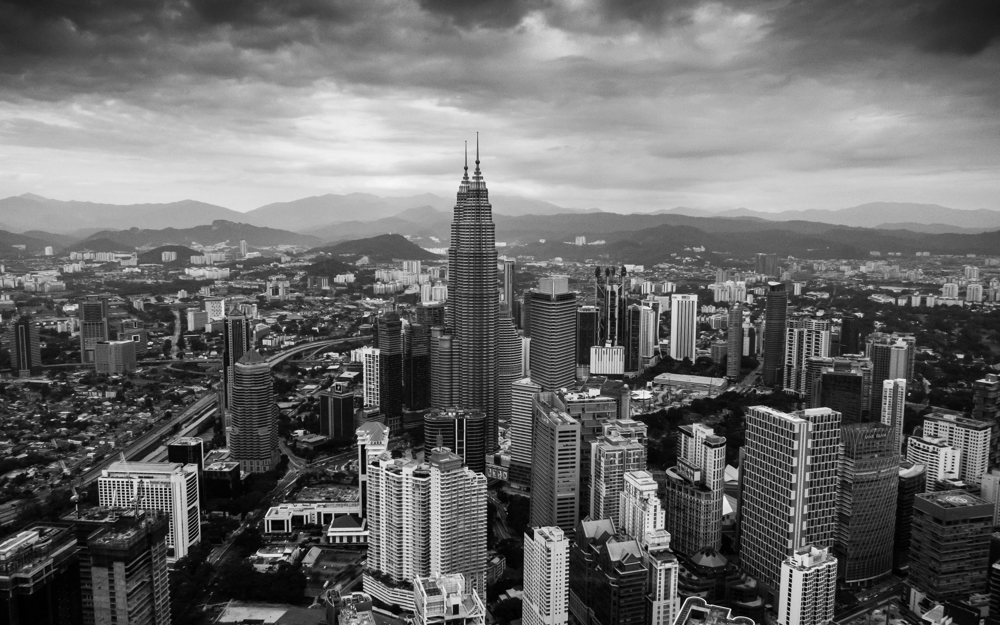

In [36]:
# Mengambil gambar
url = "https://raw.githubusercontent.com/mie-intel/Linear-Algebra/main/SVD/image.jpg" # sumber gambar
response = requests.get(url) # mengambil gambar
raw_image = Image.open(BytesIO(response.content)) # menyimpan gambar ke dalam variabel
raw_image.save("image.jpg") # simpan gambar asli
raw_image = raw_image.convert('L') # ubah gambar ke grayscale
raw_image.save('image_grey.jpg') # simpan gambar grayscale
print('Ukuran gambar asli:', os.path.getsize('image.jpg'), 'bytes')
print('Ukuran gambar grey:', os.path.getsize('image_grey.jpg'), 'bytes')
raw_image # menunjukkan gambar yang diambil

Pada hasil, terlihat bahwa gambar dengan ukuran grayscale memiliki ukuran sedikit lebih kecil daripada gambar asli. Hal ini dikarenakan grayscale setiap piksel pada gambar grayscale hanya menyimpan $1$ nilai saja yakni intensitas warna abu - abu dari piksel tersebut. Berbeda dengan gambar berformat RGB yang menyimpan $3$ nilai yakni intensitas warna merah, biru, dan hijau.

### **Mengubah gambar ke dalam bentuk matriks**

Gambar akan diperkecil ukurannya menggunakan teknik aljabar linear yakni **SVD** (_Single Value Decompositio_). Untuk itu, kita perlu mengubah format gambar tersebut ke dalam bentuk matriks dengan memanfaatkan library `numpy`

In [37]:
# Mengubah gambar ke dalam bentuk matriks
raw_matrix = np.array(raw_image)
raw_matrix

array([[28, 33, 38, ..., 33, 31, 23],
       [30, 34, 37, ..., 26, 26, 23],
       [33, 34, 36, ..., 21, 23, 25],
       ...,
       [ 1,  1,  1, ...,  9,  9,  8],
       [ 1,  1,  1, ..., 10,  9,  7],
       [ 1,  1,  1, ..., 10,  9,  7]], dtype=uint8)

### **Dimensi Matriks**

Setelah itu, kita akan melakukan **SVD** terhadap matriks gambar yang dihasilkan. Hasil **SVD** dari matriks disimpan ke dalam $3$ variabel yakni $U$ sebagai matriks $U$, $S$ sebagai matriks $\Sigma$, dan $Vt$ sebagai matriks $V^T$. Agar matriks dapat direpresentasikan dengan lebih mudah, digunakan parameter `full_matrices=False` yang membuat matriks diagonal $S$ disimpan dalam bentuk vektor dari nilai - nilai diagonal pada matriks. Sehingga apabila dimensi dari setiap matriks dikeluarkan, kita akan mendapatkan hasil berikut:

In [38]:
# Mengeluarkan dimensi matriks gambar
print("Dimensi Matriks:")
print("{:6s}".format("Gambar"), ":", raw_matrix.shape)

print()

# Melakukan Single Value Decomposition
U, S, Vt = np.linalg.svd(raw_matrix, full_matrices=False)
print("Single Value Decomposition")
print("{:>6s}".format("U"), ":", U.shape)
print("{:>6s}".format("S"), ":", S.shape)
print("{:>6s}".format("Vt"), ":", Vt.shape)

Dimensi Matriks:
Gambar : (2400, 3840)

Single Value Decomposition
     U : (2400, 2400)
     S : (2400,)
    Vt : (2400, 3840)


### **Melakukan kompresi**

Untuk mempermudah, dibuatlah sebuah fungsi bernama `compress(k)` yang bertujuan untuk mengompress gambar dengan mengambil $k$ sebagai parameter. $k$ disini adalah banyak kolom yang diambil pada matriks $U$, banyak nilai yang diambil pada matriks diagonal $S$, dan banyak baris yang diambil pada matriks $V_t$ untuk melakukan kompresi. Berikut adalah illustrasi pengambilan kolom / baris yang dilakukan.

<p align="center" flex="row">
<img src="https://raw.githubusercontent.com/mie-intel/Linear-Algebra/main/SVD/svd2.png" height="240"/>
</p>

Sesuai dengan dasar teori, nilai pada matriks diagonal $S$ terurut secara _non-ascending_. Untuk mendapatkan nilai $k$ yang cukup baik untuk digunakan dalam kompresi, kita dapat melihat terlebih dahulu grafik penurunan nilai pada matriks (hal ini ditunjukkan pada fungsi `plt.plot(S_k)` dan `plt.show()` yang dimiliki library `matplotlib`). Kemudian, titik yang mengalami penurunan cukup landai* dapat diambil sebagai salah satu nilai $k$ yang mungkin. *_Catatan_: titik yang dipilih diusahakan agar memiliki nilai sekecil mungkin agar gambar hasil kompresi memiliki ukuran sekecil mungkin juga.

In [39]:
# Fungsi untuk melakukan kompresi matriks dengan mengambil k nilai pada matriks sum
def compress(k, show = True):
    U_k = U[:,:k]
    S_k = S[:k]
    Vt_k = Vt[:k,:]

    # untuk mendapatkan nilai nilai dari matriks diagonal sum
    if show:
        plt.plot(S_k)
        plt.xlabel('k')
        plt.ylabel(r'$\sigma_k$')
        plt.show()

    # Mengubah vektor S_k menjadi matriks diagonal
    S_k = np.diag(S_k)

    # melakukan dot product untuk mendapatkan matriks akhir
    compressed_matrix = np.dot(np.dot(U_k, S_k), Vt_k)
    return compressed_matrix

Kemudian, kita akan mencoba untuk memilih nilai $k$ maksimum yang mungkin. $k$ maksimum yang mungkin adalah rank dari matriks $S$.Pada posisi ini, gambar belum di kompres. Kita hanya ingin melihat grafik dari nilai - nilai yang ada pada matriks. Sehingga berikut hasilnya. 

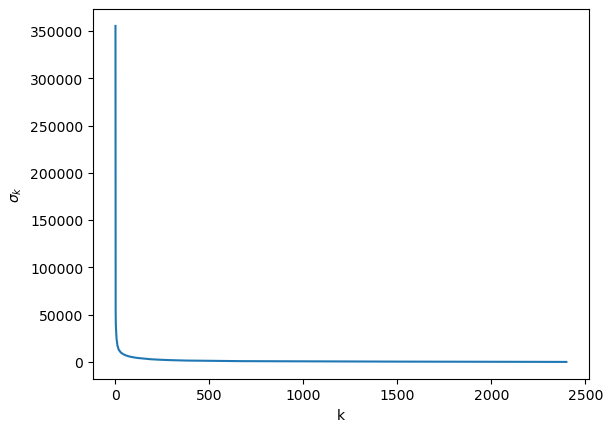

array([[28., 33., 38., ..., 33., 31., 23.],
       [30., 34., 37., ..., 26., 26., 23.],
       [33., 34., 36., ..., 21., 23., 25.],
       ...,
       [ 1.,  1.,  1., ...,  9.,  9.,  8.],
       [ 1.,  1.,  1., ..., 10.,  9.,  7.],
       [ 1.,  1.,  1., ..., 10.,  9.,  7.]])

In [40]:
# Melihat nilai - nilai dari matriks diagonal dengan memilih k = 2400
compress(2400)

### **Mencari nilai $k$ yang cukup baik**

Kita dapat memilih sebuah nilai $k$ yang dirasa cukup baik. Suatu nilai $k$ dinilai cukup baik apabila selisih nilai $\sigma_{k-1}$ $\sigma_{k}$ tidak terlalu besar dan nilai $k$ sekecil mungkin. Berdasarkan grafik, nilai dari $10$ hingga $150$ terlihat cukup baik. Sehingga kita akan mencoba nilai - nilai tersebut di setiap interval $20$. Pada saat ini, kita juga akan sekaligus melakukan konversi matriks ke dalam bentuk gambar dengan fungsi berikut

In [41]:
def revert_to_image(matrix):
    # Menghapus nilai yang tidak berada di rentang 0 - 255
    matrix = np.clip(matrix, 0, 255)

    # Mengubah type data menjadi .uint8 (agar dapat dikonversi ke bentuk gambar)
    matrix = matrix.astype(np.uint8)

    # Mengubah ke dalam bentuk gambar
    image = Image.fromarray(matrix)
    return image

Berikut adalah kode untuk mencoba - coba nilai - nilai $k$ yang mungkin.

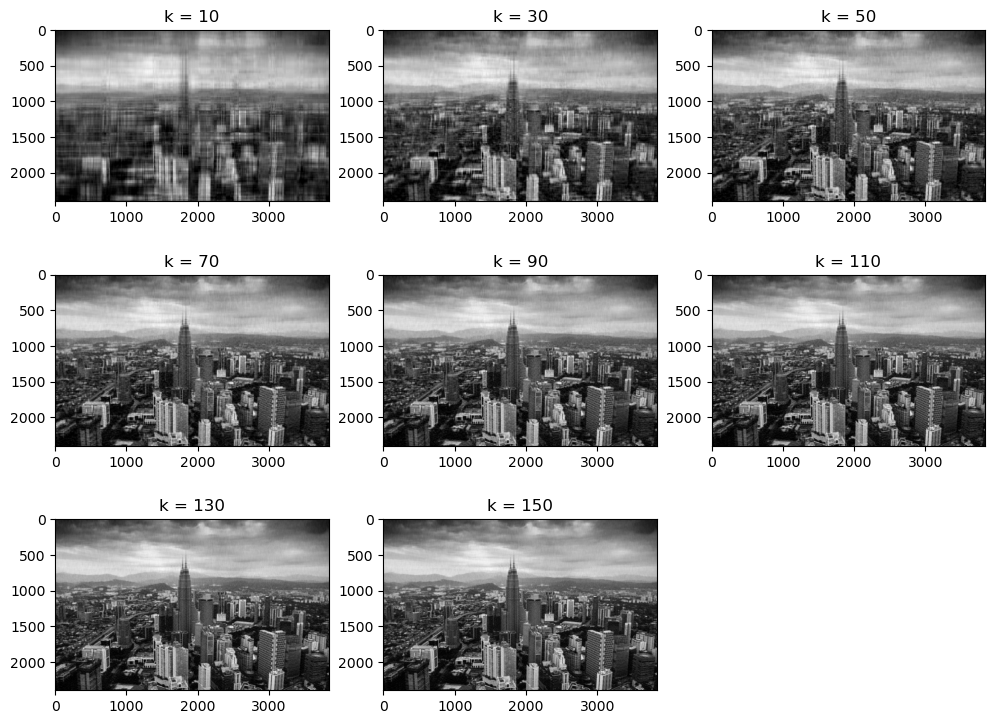

In [42]:
plt.figure(figsize=(12, 9))

# mencoba nilai - nilai yang ada
for k in range(10, 151, 20):
    tmp_matrix = compress(k, show = False)
    tmp_image = revert_to_image(tmp_matrix)
    plt.subplot(3, 3, ((k + 10) // 20))
    plt.imshow(tmp_image, cmap="gray")
    plt.title(f"k = {k}")


Setelah diperhatikan, terlihat bahwa $k = 90$ masih menghasilkan gambar yang **cukup** baik. Sehingga kita akan memilih $70$ sebagai nilai dari $k$ yang kita pilih.

Setelah itu, pilih kompres gambar dengan mengambil $90$ nilai pada matriks diagonal $S$.

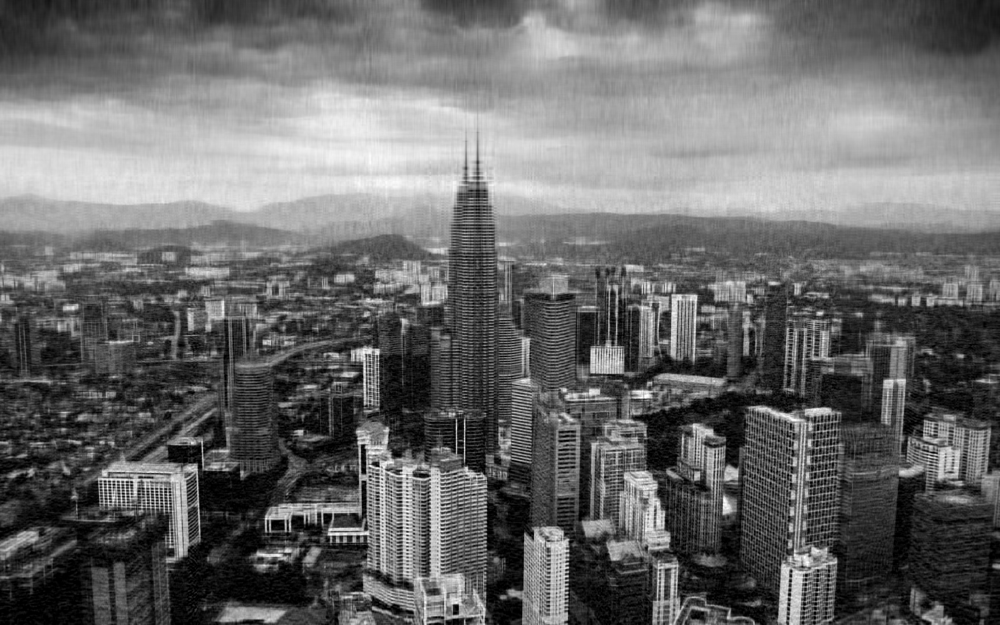

In [43]:
compressed_matrix = compress(90, False)
compressed_image = revert_to_image(compressed_matrix)
# Menyimpan gambar hasil kompresi
compressed_image.save("compressed_image.jpg")
compressed_image

Terlihat hasil kompresi dari gambar di atas. Gambar sedikit _blur_ dikarenakan gambar merupakan hasil kompresi.

### **Hasil Akhir**

Dan berikut adalah perbandingan ukuran dari gambar semula dengan gambar hasil kompresi

Perbandingan ukuran gambar hasil kompresi dengan gambar semula dinyatakan dalam 
$$(1 - \frac{ukuran \space kompresi}{ukuran \space asli}) \times 100$$

In [44]:
# Mendapatkan ukuran gambabr
raw_size = os.path.getsize('image.jpg')
compressed_size = os.path.getsize('compressed_image.jpg')
compression_ratio = (1 - compressed_size / raw_size) * 100

print("Ukuran gambar")
print("=" * 30)
print("{:14s}".format("Gambar asli"), ":", raw_size, "bytes")
print("{:14s}".format("Hasil kompresi"), ":", compressed_size, "bytes")
print()
print("Gambar menjadi {0:.2f}% lebih kecil!".format(compression_ratio));

Ukuran gambar
Gambar asli    : 1883657 bytes
Hasil kompresi : 1008759 bytes

Gambar menjadi 46.45% lebih kecil!


Terlihat bahwa gambar berhasil dikompresi dengan hasil kompresi memiliki ukuran memori $\textbf{46.45\%}$ lebih kecil.

### **Mengapa ukuran gambar menjadi lebih kecil?**

Hal ini dikarenakan kita hanya mengambil $k$ nilai terbesar saja pada matriks $\Sigma$ yang membuat dimensi dari matriks dekomposisi menjadi lebih kecil dan mengurangi penggunaan memori yang ada.

### **Analisis SVD untuk kompresi gambar**

#### Perbandingan nilai k dengan kualitas dan memori yang diperlukan gambar

* Semakin besar nilai $k$, semakin baik kualitas gambar tetapi memori yang diperlukan juga semakin besar
* Semakin kecil nilai $k$, semakin buruk kualitas gambar tetapi memori yang diperlukan semakin sedikit

Dengan begitu, pemilihan nilai $k$ yang tepat menjadi kunci dari keseimbangan antara ukuran file dengan kualitas gambar yang dihasilkan. 

### **Daftar Pustaka**

* Brough, R., Hoge, S., Masquelier, A., dan Sonsini, R., (2018). _SVD Image Compression_. Diakses pada Juni 2024.
* Fajar Sidik, Y., (2024). _Linear Algebra, Lecture 8: Singular Value Decomposition, Introduction and SVD Formula_. Diakses pada Juni 2024
* Munir, R., (2020). Seri bahan kuliah Algeo #19b: _Singular Value Decomposition_ (SVD). Diakses pada Juni 2024.